In [6]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
!pip install pandas_profiling

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# <h1 style="font-family: Trebuchet MS; padding: 12px; font-size: 48px; color: #BA1141; text-align: center; line-height: 1.25;"><b>💕💔 GOLD PRICE<span style="color: #000000"> EDA & Prediction 🔮</span></b><br><span style="color: #FF5C8A; font-size: 24px">with Machine Learning Models </span></h1>
<hr>

# <div style="font-family: Trebuchet MS; background-color: #8A0030; color: #FFFFFF; padding: 12px; line-height: 1.5;">Importing Libraries 📚</div>
<div style="font-family: Segoe UI; line-height: 2; color: #000000; text-align: justify">
    👉 <b>Importing libraries</b> that will be used in this notebook.
</div>

In [7]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt #plotting graphs and chaarts
import seaborn as sns #drawing statistical graphics
%matplotlib inline
import pandas_profiling as pp
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics

# <div style="font-family: Trebuchet MS; background-color: #8A0030; color: #FFFFFF; padding: 12px; line-height: 1.5;">3. | Color Palettes 🎨</div>
<div style="font-family: Segoe UI; line-height: 2; color: #000000; text-align: justify">
    👉 This section will create some <b>color palettes</b> that will be used in this notebook.
</div>

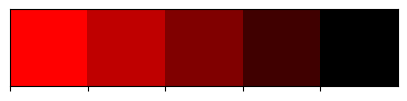

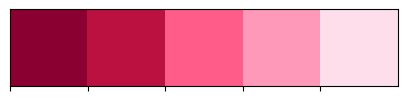

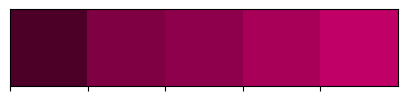

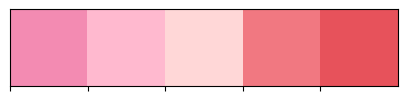

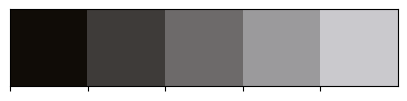

In [8]:
# --- Create List of Color Palletes ---
red_grad = ['#FF0000', '#BF0000', '#800000', '#400000', '#000000']
pink_grad = ['#8A0030', '#BA1141', '#FF5C8A', '#FF99B9', '#FFDEEB']
purple_grad = ['#4C0028', '#7F0043', '#8E004C', '#A80059', '#C10067']
color_mix = ['#F38BB2', '#FFB9CF', '#FFD7D7', '#F17881', '#E7525B']
black_grad = ['#100C07', '#3E3B39', '#6D6A6A', '#9B9A9C', '#CAC9CD']

# --- Plot Color Palletes --
sns.palplot(red_grad)
sns.palplot(pink_grad)
sns.palplot(purple_grad)
sns.palplot(color_mix)
sns.palplot(black_grad)

# <div style="font-family: Trebuchet MS; background-color: #8A0030; color: #FFFFFF; padding: 12px; line-height: 1.5;">Reading Dataset 👓</div>
<div style="font-family: Segoe UI; line-height: 2; color: #000000; text-align: justify">
    👉 After importing libraries, <b>the dataset that will be used will be imported</b>.
</div>


In [9]:
# --- Importing Dataset ---
gold_data = pd.read_csv("kaggle/input/gold-price-data/gld_price_data.csv")

# --- Reading Dataset ---
gold_data.head().style.background_gradient(cmap='Reds').set_properties(**{'font-family': 'Segoe UI'}).hide_index()


<ipython-input-9-65068d5ffcd0>:5: FutureWarning: this method is deprecated in favour of `Styler.hide(axis="index")`
  gold_data.head().style.background_gradient(cmap='Reds').set_properties(**{'font-family': 'Segoe UI'}).hide_index()


Date,SPX,GLD,USO,SLV,EUR/USD
1/2/2008,1447.160034,84.860001,78.470001,15.180000,1.471692
1/3/2008,1447.160034,85.570000,78.370003,15.285000,1.474491
1/4/2008,1411.630005,85.129997,77.309998,15.167000,1.475492
1/7/2008,1416.180054,84.769997,75.500000,15.053000,1.468299
1/8/2008,1390.189941,86.779999,76.059998,15.590000,1.557099


In [10]:
gold_data.isna().sum()

Date       0
SPX        0
GLD        0
USO        0
SLV        0
EUR/USD    0
dtype: int64

In [11]:
gold_data.describe().style.background_gradient(cmap='Reds').set_properties(**{'font-family': 'Segoe UI'}).hide_index()

<ipython-input-11-a9737ed58cd8>:1: FutureWarning: this method is deprecated in favour of `Styler.hide(axis="index")`
  gold_data.describe().style.background_gradient(cmap='Reds').set_properties(**{'font-family': 'Segoe UI'}).hide_index()


SPX,GLD,USO,SLV,EUR/USD
2290.000000,2290.000000,2290.000000,2290.000000,2290.000000
1654.315776,122.732875,31.842221,20.084997,1.283653
519.111540,23.283346,19.523517,7.092566,0.131547
676.530029,70.000000,7.960000,8.850000,1.039047
1239.874969,109.725000,14.380000,15.570000,1.171313
1551.434998,120.580002,33.869999,17.268500,1.303297
2073.010070,132.840004,37.827501,22.882500,1.369971
2872.870117,184.589996,117.480003,47.259998,1.598798


In [12]:
# --- Print Dataset Info ---
print('\033[1m'+'.: Dataset Info :.'+'\033[0m')
print('*' * 30)
print('Total Rows:'+'\033[1m', gold_data.shape[0])
print('\033[0m'+'Total Columns:'+'\033[1m', gold_data.shape[1])
print('\033[0m'+'*' * 30)
print('\n')

# --- Print Dataset Detail ---
print('\033[1m'+'.: Dataset Details :.'+'\033[0m')
print('*' * 30)
gold_data.info(memory_usage = False)

.: Dataset Info :.
******************************
Total Rows: 2290
Total Columns: 6
******************************


.: Dataset Details :.
******************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2290 entries, 0 to 2289
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Date     2290 non-null   object 
 1   SPX      2290 non-null   float64
 2   GLD      2290 non-null   float64
 3   USO      2290 non-null   float64
 4   SLV      2290 non-null   float64
 5   EUR/USD  2290 non-null   float64
dtypes: float64(5), object(1)

# <div style="font-family: Trebuchet MS; background-color: #8A0030; color: #FFFFFF; padding: 12px; line-height: 1.5;"> Pandas Profiling 🔍</div>
<div style="font-family: Segoe UI; line-height: 2; color: #000000; text-align: justify">
    👉 This section will focused on <b>Pandas profiling</b> before applying ML models.

In [13]:
pp.ProfileReport(gold_data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### <div style="font-family: Trebuchet MS; background-color: #FF5C8A; color: #FFFFFF; padding: 12px; line-height: 1.5;">  Joint plot</div>

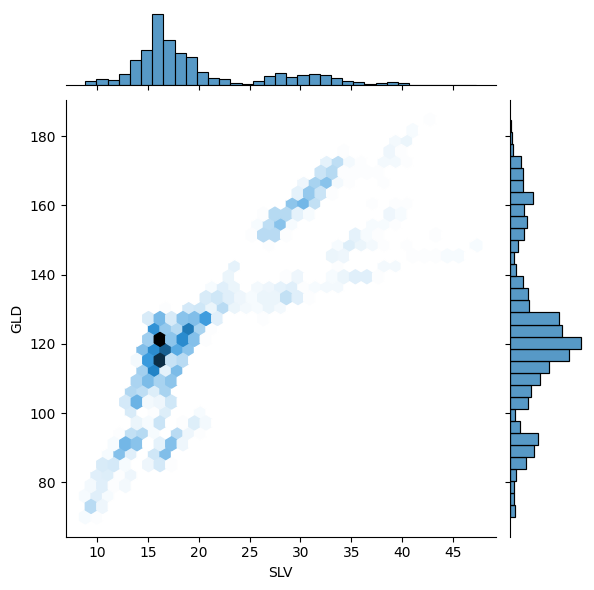

In [14]:
sns.jointplot(x='SLV',y='GLD',kind='hex',data=gold_data)

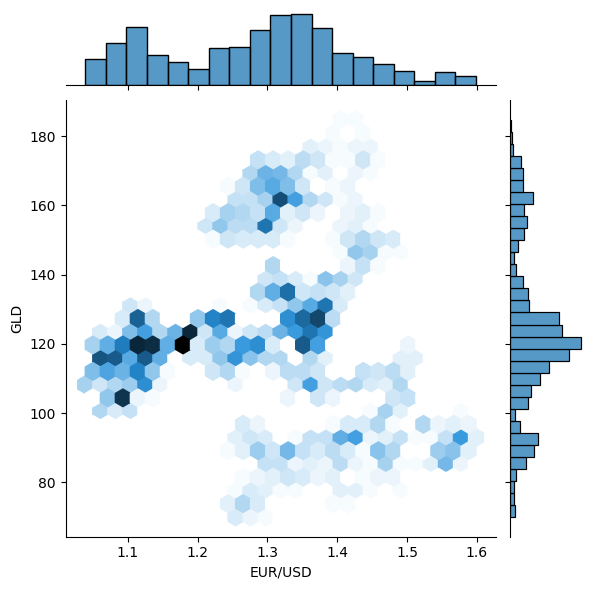

In [15]:
sns.jointplot(x='EUR/USD',y='GLD',kind='hex',data=gold_data)

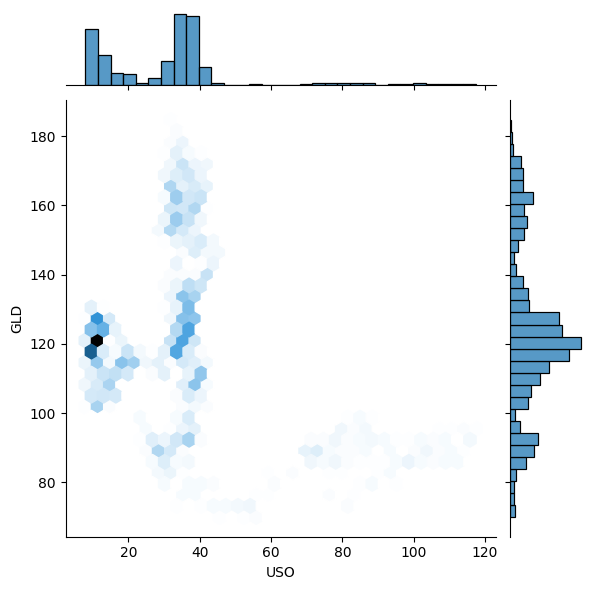

In [16]:
sns.jointplot(x='USO',y='GLD',kind='hex',data=gold_data)

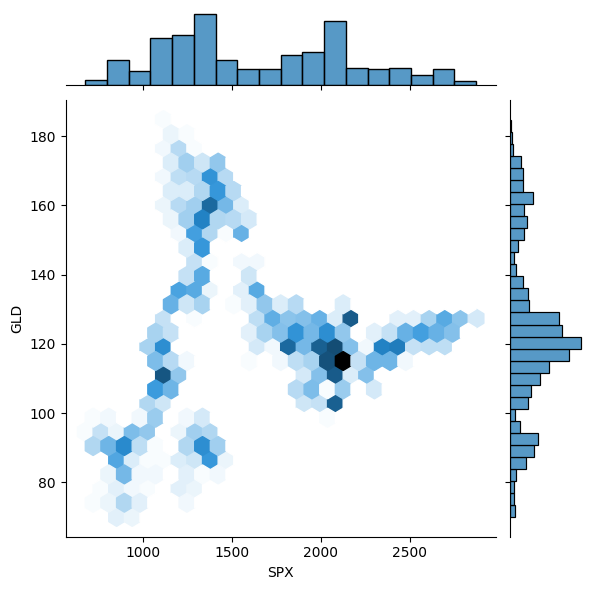

In [17]:
sns.jointplot(x='SPX',y='GLD',kind='hex',data=gold_data)

<ipython-input-18-e7b4c1ed9da3>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(gold_data.corr())


<Axes: >

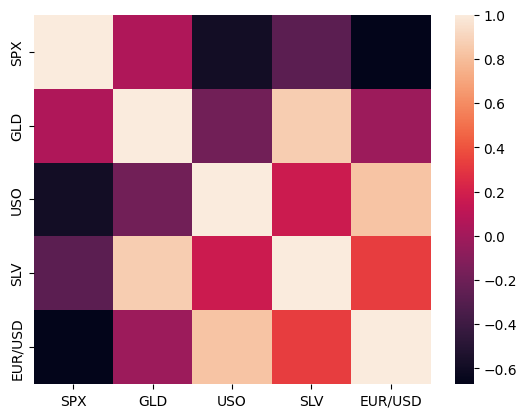

In [18]:
sns.heatmap(gold_data.corr())

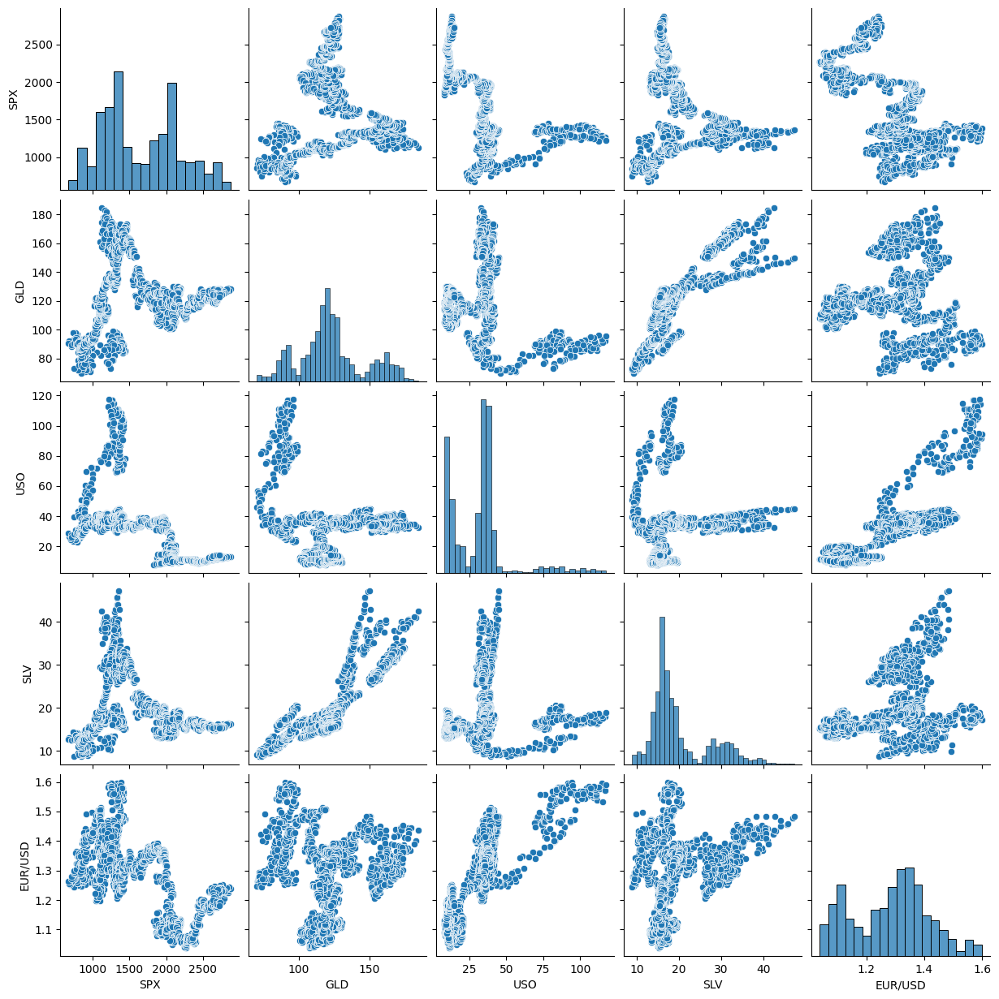

In [19]:
sns.pairplot(gold_data)

# <div style="font-family: Trebuchet MS; background-color: #8A0030; color: #FFFFFF; padding: 12px; line-height: 1.5;">  Auto Visualization 🔍</div>
<div style="font-family: Segoe UI; line-height: 2; color: #000000; text-align: justify">
    👉 This section will focused on <b>Auto Visualization</b> before applying ML models.

In [20]:
!pip install autoviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.6/356.6 kB 12.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 29.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 60.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 70.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 53.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.9/121.9 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.9/84.9 kB 11.0 MB/s eta 0:00:00
  Created wheel for emoji: filename=emoji-2.6.0-py2.py3-none-any.whl size=351311 sha256=cd003d48252776d6a423bf62ec76bcd00ed113a90208aa9235aff6dc1c098315
  Stored in directory: /root/.cache/pip/wheels/ea/0b/64/114bc939d0083621aa41521e21be246c888260b8aa21e6c1ad
Successfully built emoji
  Attempting uninstall: holoviews
 

Imported v0.1.720. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (2290, 6)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    6 Predictors classified...
        1 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['Date']
To fix data quality issues automatically, import FixDQ from autoviz...


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Date,object,0.000000,100,nan,nan,"Possible ID colum: drop before modeling process., 2290 rare categories: Too many to list. Group them into a single category or drop the categories., high cardinality with 2290 unique values: Use hash encoding or embedding to reduce dimension."
SPX,float64,0.000000,NA,676.530029,2872.870117,No issue
GLD,float64,0.000000,NA,70.000000,184.589996,has 115 outliers greater than upper bound (167.51) or lower than lower bound(75.05). Cap them or remove them.
USO,float64,0.000000,NA,7.960000,117.480003,has 134 outliers greater than upper bound (73.00) or lower than lower bound(-20.79). Cap them or remove them.
SLV,float64,0.000000,NA,8.850000,47.259998,"has 117 outliers greater than upper bound (33.85) or lower than lower bound(4.60). Cap them or remove them., has a high correlation with ['GLD']. Consider dropping one of them."
EUR/USD,float64,0.000000,NA,1.039047,1.598798,has a high correlation with ['USO']. Consider dropping one of them.


Number of All Scatter Plots = 15
All Plots done
Time to run AutoViz = 2 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


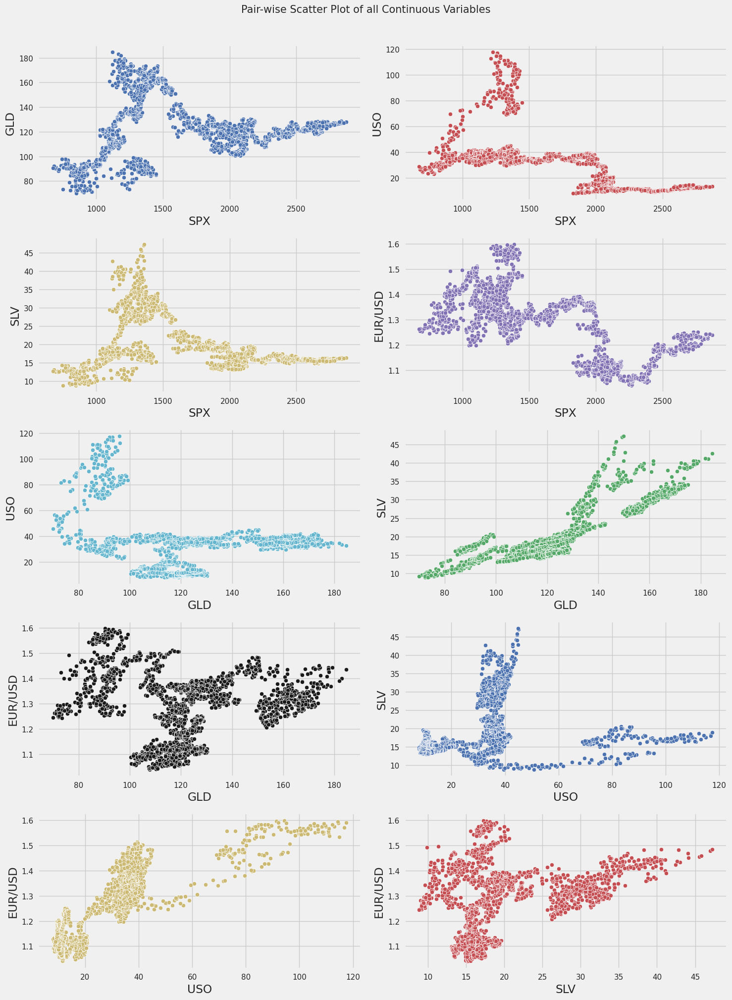

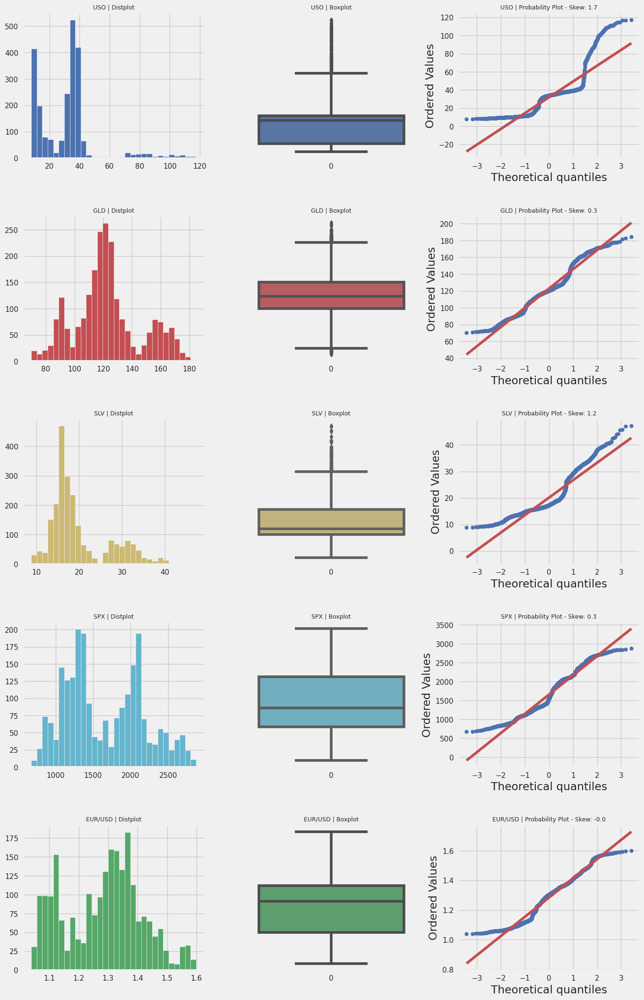

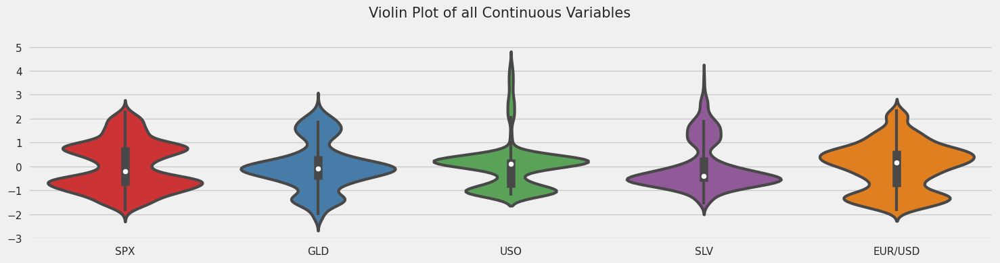

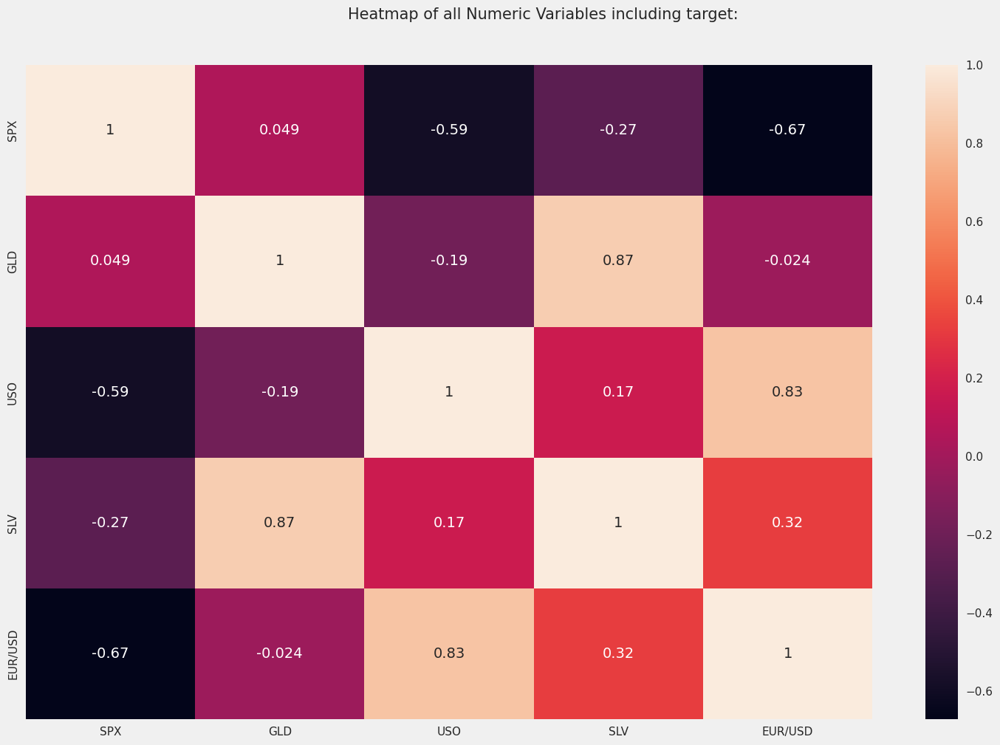

In [21]:
plt.figure(figsize = (10, 5))
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
df_av = AV.AutoViz('kaggle/input/gold-price-data/gld_price_data.csv')
plt.show()

In [22]:
correlation = gold_data.corr()

In [23]:
# constructing a heatmap to understand the correlatiom
plt.figure(figsize = (8,8))
sns.heatmap(correlation, cbar=True, square=True, fmt='.1f',annot=True, annot_kws={'size':8}, cmap='Blues')

<Axes: >

In [24]:
# correlation values of GLD
print(correlation['GLD'])

SPX        0.049345
GLD        1.000000
USO       -0.186360
SLV        0.866632
EUR/USD   -0.024375
Name: GLD, dtype: float64


In [25]:
# checking the distribution of the GLD Price
sns.distplot(gold_data['GLD'],color='green')

<Axes: xlabel='GLD', ylabel='Density'>

# <div style="font-family: Trebuchet MS; background-color: #BA1141; color: #FFFFFF; padding: 12px; line-height: 1.5;">Split Data 🛠</div>
<div style="font-family: Segoe UI; line-height: 2; color: #000000; text-align: justify">
  

In [26]:
X = gold_data.drop(['Date','GLD'],axis=1)
Y = gold_data['GLD']

In [27]:
print(X)

          SPX         USO       SLV     EUR/USD
0     1447.160034  78.470001  15.1800  1.471692
1     1447.160034  78.370003  15.2850  1.474491
2     1411.630005  77.309998  15.1670  1.475492
3     1416.180054  75.500000  15.0530  1.468299
4     1390.189941  76.059998  15.5900  1.557099
...           ...        ...      ...       ...
2285  2671.919922  14.060000  15.5100  1.186789
2286  2697.790039  14.370000  15.5300  1.184722
2287  2723.070068  14.410000  15.7400  1.191753
2288  2730.129883  14.380000  15.5600  1.193118
2289  2725.780029  14.405800  15.4542  1.182033

[2290 rows x 4 columns]


In [28]:
print(Y)

0        84.860001
1        85.570000
2        85.129997
3        84.769997
4        86.779999
           ...    
2285    124.589996
2286    124.330002
2287    125.180000
2288    124.489998
2289    122.543800
Name: GLD, Length: 2290, dtype: float64


In [29]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state=2)

# <div style="font-family: Trebuchet MS; background-color: #BA1141; color: #FFFFFF; padding: 12px; line-height: 1.5;">Model Implementation 🛠</div>
<div style="font-family: Segoe UI; line-height: 2; color: #000000; text-align: justify">
    👉 This section will implement various machine learning models as mentioned in <b>Introduction</b> section. In addition, explanation for each models will be discussed.
</div>

## <div style="font-family: Trebuchet MS; background-color: #FF5C8A; color: #FFFFFF; padding: 12px; line-height: 1.5;">Random Forest</div>
<div style="font-family: Segoe UI; line-height: 2; color: #000000; text-align: justify">
    <blockquote style="color: #000000;">
    <mark><b>Random Forest</b></mark> is a tree-based machine learning algorithm that <b>leverages the power of multiple decision trees for making decisions</b>. Each individual tree in the random forest spits out a class prediction and the class with the most votes becomes our model’s prediction. <b>A large number of relatively uncorrelated models (trees) operating as a committee will outperform any of the individual constituent models</b>.<br>
    <center>
    <img src="https://cdn.analyticsvidhya.com/wp-content/uploads/2020/02/rfc_vs_dt1.png" alt="RF" width="35%"><br>
    <i>🖼 Random Forest by Abhishek Sharma</i>
    </center>
    </blockquote>
</div>

In [30]:
regressor = RandomForestRegressor(n_estimators=100)

In [31]:
# training the model
regressor.fit(X_train,Y_train)

RandomForestRegressor()

In [32]:
# prediction on Test Data
test_data_prediction = regressor.predict(X_test)

In [33]:
print(test_data_prediction)

[168.5949994   82.06610001 116.02829992 127.63120074 120.62970126
 154.83459765 150.6137989  126.30240008 117.48869895 126.04490089
 116.58860105 172.08340104 142.20939837 168.07429868 115.0666998
 117.4967005  139.51200319 170.06580042 159.8676031  160.86949911
 155.05930045 125.2792004  176.1432002  157.59190323 125.21020032
  93.6228995   76.95350008 120.71660004 119.07249902 167.45450132
  88.21520019 125.22350021  91.15150081 117.82229981 121.21539915
 135.88650109 115.23400144 115.20030077 146.41050033 107.21440105
 104.48280254  87.46349817 126.41130117 117.94909984 153.03449909
 119.6166002  108.45599977 108.03879782  93.20810051 127.06729781
  74.94840036 113.56749949 121.43239993 111.13819894 118.88159892
 121.04459931 159.43449949 166.9760005  147.0626968   85.92659881
  94.44850028  86.86619844  90.59030012 118.96750062 126.36110076
 127.5695     169.45669949 122.23469947 117.32389873  98.37610016
 168.47780081 143.47369906 131.88220178 121.2193024  120.93369954
 120.054500

In [34]:
# R squared error
error_score = metrics.r2_score(Y_test, test_data_prediction)
print("R squared error : ", error_score)

R squared error :  0.9894510405046517


In [35]:
Y_test = list(Y_test)

In [37]:
plt.plot(Y_test, color='blue', label = 'Actual Value')
plt.plot(test_data_prediction, color='green', label='Predicted Value')
plt.title('Actual Price vs Predicted Price')
plt.xlabel('Number of values')
plt.ylabel('GLD Price')
plt.legend()
plt.show()